# **PHẦN I. QUÁ TRÌNH HÌNH THÀNH BỘ DỮ LIỆU**

# A. ĐỘNG LỰC PHÁT TRIỂN BỘ DỮ LIỆU COVID19 CHO TIẾNG VIỆT

- Cuối năm 2019, đầu năm 2020 cả thế giới đã phải đối mặt với một hiểm họa mang tính toàn cầu đó chính là dịch bệnh mang tên Corona mà sau này được đổi tên thành Covid19.
- Chính vì tính chất nghiêm trọng của nó mà thông tin về dịch bệnh, ca bệnh, ... được cập nhật liên tục dưới nhiều dạng văn bản khác nhau và với số lượng rất lớn.
- Điều này đã trực tiếp dẫn đến việc thiết kế các tập dữ liệu về Covid19 để phục vụ nghiên cứu hoặc ứng dụng vào các tác vụ downstream trong lĩnh vực NLP với mục đích tạo ra các đóng góp cho xã hội chống lại dịch bệnh.
- Tuy nhiên, đa số các tập dữ liệu được tạo ra trên ngôn ngữ tiếng Anh. Mà dịch bệnh là vấn đề mang tính toàn cầu do đó điều rất cần thiết là thiết kế dữ liệu về Covid19 trên những ngôn ngữ khác ngoài tiếng Anh.
- Đó chính là động lực để nhóm nghiên cứu của VinAI phát triển bộ dữ liệu Covid19-NER for Vietnamese.

# B. QUÁ TRÌNH TẠO HOÀN CHỈNH BỘ DỮ LIỆU SAU CÙNG

## 1. ENTITY TYPES

Nhóm tác giả đã định nghĩa ra 10 loại thực thể liên quan đến các ca nhiễm covid-19 nhằm trích xuất một cách đầy đủ nhất thông tin về một ca bệnh.
Các loại thực thể được định nghĩa theo tác giả như sau:
![image](https://res.cloudinary.com/vtphong/image/upload/v1699159823/intro2Language/entity_types.png)

## 2. DATA COLLECTION

Thu thập các bài báo liên quan đến COVID-19 với keyword tìm kiếm là COVID trên các trang báo online của Việt Nam như VnExpress, BaoMoi, ZingNews, ThanhNien.

## 3. ARTICLE SEGMENTATION

- Sau khi các bài báo được thu thập, nhóm tác giả sử dụng mô hình sentence and word segmentation tên là RDRSegmenter do chính họ công bố năm 2018. Mô hình này xây dựng một cây sinh luật để phân đoạn một cách tự động những câu trong một đoạn văn hay những từ ở mức 1 hay nhiều âm tiết trong một câu. Xem chi tiết mô hình [tại đây](https://arxiv.org/pdf/1709.06307.pdf).
- Sau khi chia tất cả các bài báo thành các câu, nhóm tác giả thực hiện chọn ra các câu có chưa thông tin về dịch bệnh COVID-19 bằng một search engine tên là BM25PLUS:
  + BM25PLUS là mô hình phát triển từ thuật toán tìm kiếm xếp hạng tên là BM25 (Best Match 25) do Robertson và Walker công bố năm 1994.
  + Thuật toán này sẽ tính điểm (mức độ liên quan) của một tập các query Q đối với một document ${D}_{i}$, sau đó xếp hạng tất cả các document ${D}_{i}$ này theo thứ tự điểm từ lớn đến bé.

Công thức tính điểm như sau:
![image](https://res.cloudinary.com/vtphong/image/upload/v1699162749/intro2Language/BM25_algo.png)
Xem chi tiết thuật toán [tại đây](https://medium.com/@evertongomede/understanding-the-bm25-ranking-algorithm-19f6d45c6ce).

- Tiếp đến nhóm tác giả sẽ chọn 15000 câu xếp hạng cao nhất được trả về từ BM25PLUS.
- Cuối cùng thực hiện lọc một cách thủ công các câu có chứa thông tin dịch bệnh trong Việt Nam.
- Kết quả là một tập dữ liệu gồm 10027 câu.

## 4. ANOTATION PROCESS

Quá trình đánh dấu được chia làm hai giai đoạn:
- Giai đoạn 1:
  + Chon ra một tập con gồm 1000 câu từ tập dữ liệu lớn 10027 câu. Sau đó hai chuyên gia sẽ làm việc một cách riêng lẻ để đánh dấu (gán nhãn các từ) cho 1000 câu này.
  + Tiếp theo dùng độ đo F1 để tính điểm giữa 2 bản đánh dấu của hai chuyên gia, kết quả ban đầu đạt được là 0.88.
  + Để kết thúc cho giai đoạn 1 thì nhóm tác giả mở một cuộc thảo luận chung với hai chuyên gia về các trường hợp phức tạp và bị xung đột để tin chỉnh ra bộ các quy tắc đánh dấu cuồi cùng.
- Giai đoạn 2:
  + Chia toàn bộ 10027 câu thành 10 tập con có kích thước bằng nhau và không trùng lắp, mỗi tập con sẽ có chứa 100 câu từ 1000 câu được chọn tron giai đoạn 1. Nhóm tác giả thuê 10 sinh viên tốt nghiệp với khả năng cao về kiến thức ngôn ngữ và dựa vào bảng quy tắc để tiến hành đánh dấu các câu cho 10 tập con.
  + Độ đo F1 cho chất lượng đánh dấu của mỗi sinh viên sẽ dựa vào 100 câu đã có sẵn gold labels. 10 sinh viên này được yêu cầu đánh dấu cho tới khi F1 đạt ít nhất 0.92.

Ban đầu tập dataset dẽ được tiến hành đánh dấu ở mức từng syllable. Sau khi có được tập dữ liệu ở mức syylable, nhóm tác giả lại một lần nữa áp dụng RDRSegmenter để tạo ra tập dữ liệu ở mức 2-words.

## 5. ANOTATION PROCESS

Nhóm tác giả chia tập dữ liệu đã được xử lý thành 3 tập train/validation/test với tỉ lệ 5/2/3.

# **PHẦN II. EDA**

# A. Set up

## 1. Cài đặt các thư viện và hàm

### 1.1 Các thư viện cần thiết

In [1367]:
import pandas as pd
import json
import numpy as np
import seaborn as sns
import plotly.express as px


### 1.2 Các hàm hỗ trợ

In [1368]:
# Đếm số lượng các câu
def num_sentence(file_path):
    num_sentences = 0

    with open(file_path, 'r', encoding='utf-8') as file:
        for line in file:
            if line.strip() == "":
                num_sentences += 1

    # Đếm số câu
    print("Số câu (sentence) trong tập dữ liệu là:", num_sentences)

In [1369]:
# Các giá trị thống kê cơ bản: độ dài lớn nhất, nhỏ nhất, trung bình của các câu văn
# Vì tập dữ liệu có gắn tag entity cho toàn bộ các từ, dấu câu, ký tự đặc biệt,... 
# Nên việc xác định các giá trị thống kê cơ bản của sentence sẽ bao gồm toàn bộ các ký tự có xuất hiện trong câu.
def statistic_sentence(file_path):
    max_sentence_length = 0
    min_sentence_length = float('inf')

    total_sentence_length = 0
    num_sentences = 0

    with open(file_path, 'r', encoding='utf-8') as file:
        current_sentence_length = 0 
        for line in file:
            line = line.strip() 

            if line: 
                current_sentence_length += 1 

            else: 
                num_sentences += 1
                total_sentence_length += current_sentence_length

                if current_sentence_length > max_sentence_length:
                    max_sentence_length = current_sentence_length
                if current_sentence_length < min_sentence_length:
                    min_sentence_length = current_sentence_length

                current_sentence_length = 0 

    if num_sentences > 0:
        average_sentence_length = total_sentence_length / num_sentences
    else:
        average_sentence_length = 0

    print("Độ dài câu dài nhất:", max_sentence_length )
    print("Độ dài câu ngắn nhất:", min_sentence_length)
    print("Độ dài trung bình của các câu:", average_sentence_length)

In [1370]:
def count_plot(df, title):
    count_entity = df['Entity'].value_counts()

    fig = px.bar(y=count_entity.values, 
             x=count_entity.index, 
             color = count_entity.index,
             color_discrete_sequence=['#26784A','#74274E'],
             text=count_entity.values,
             title= title,
             template= 'plotly_dark')

    fig.update_traces(width=0.4)
    fig.update_layout(
        xaxis_title="Entity",
        yaxis_title="count",
        font = dict(size=17,family="Franklin Gothic"))
    fig.show()

In [1371]:
def histogram(df, title):
    fig=px.histogram(df,x="Entity" ,title=title, color_discrete_sequence=px.colors.qualitative.Prism)
    fig.update_layout(template="plotly_dark",)
    fig.update_layout(title_font_size=25)
    fig.update_traces(marker=dict(color='blue', opacity=0.7), textposition='outside', texttemplate='%{y}')
    fig.update_layout(
        width=800, 
        height=700 
    )
    fig.show()

In [1372]:
def percentEntity(file_path):
    def read_conll_data(file_path):
        sentences = []
        with open(file_path, 'r', encoding='utf-8') as file:
            current_sentence = []
            for line in file:
                line = line.strip()
                if line:
                    current_sentence.append(line)
                else:
                    if current_sentence:
                        sentences.append(current_sentence)
                    current_sentence = []
            if current_sentence:
                sentences.append(current_sentence)
        return sentences

    def calculate_label_percentage(sentence):
        label_counts = {}
        total_labels = 0

        for line in sentence:
            parts = line.split()
            if len(parts) == 2:
                label = parts[1]
                if label in label_counts:
                    label_counts[label] += 1
                else:
                    label_counts[label] = 1
                total_labels += 1

        label_percentages = {label: count / total_labels * 100 for label, count in label_counts.items()}
        return label_percentages

    def calculate_average_label_percentage(sentences):
        total_label_percentages = {}
        total_sentences = len(sentences)

        for sentence in sentences:
            label_percentages = calculate_label_percentage(sentence)
            for label, percentage in label_percentages.items():
                if label in total_label_percentages:
                    total_label_percentages[label] += percentage
                else:
                    total_label_percentages[label] = percentage

        average_label_percentages = {label: percentage / total_sentences for label, percentage in total_label_percentages.items()}
        return average_label_percentages

    sentences = read_conll_data(file_path)

    average_label_percentages = calculate_average_label_percentage(sentences)

    df = pd.DataFrame(list(average_label_percentages.items()), columns=['Enity', '%'])
    return df

In [1373]:
def pie_chart(df, title):
    a = df['%'][0]
    b = df["%"].iloc[1:19].sum()
    data = [
        {'Entity': 'O', '%': a},
        {'Entity': 'Other', '%': b}
    ]
    df = pd.DataFrame(data)
    fig = px.pie(values=df["%"], 
                 names=df["Entity"], 
                 color_discrete_sequence=["#CDACD1", "#9FD0A8"],
                 title= title,template='plotly_dark')
    fig.update_layout(
    width=800, 
    height=500  
    )

    fig.data[0].marker.line.width = 2
    fig.data[0].marker.line.color='gray'
    fig.update_layout(
        font=dict(size=20,family="Franklin Gothic"))
    fig.show()

## 2. Đọc các tập dữ liệu

### 2.1 train_syllable

In [1374]:
file_path_train = 'Data/train_syllable.conll'

In [1375]:
columns = ['Token', 'Entity']
token_entity_train = pd.read_csv(file_path_train, sep=' ', names=columns, quoting=3, encoding='utf-8')

In [1376]:
# Loại bỏ các ký tự thừa (dấu ))
token_entity_train_clear = token_entity_train.loc[~((token_entity_train['Token'] == ',') 
                  | (['Token'] == '.') | (token_entity_train['Token'] == '"') 
                  | (token_entity_train['Token'] == '(') | (token_entity_train['Token'] == ')')
                  | ((token_entity_train['Token'] == ':')))]

### 2.2 test_syllable

In [1377]:
file_path_test = 'Data/test_syllable.conll'

In [1378]:
columns = ['Token', 'Entity']
token_entity_test = pd.read_csv(file_path_test, sep=' ', names=columns, quoting=3, encoding='utf-8')

In [1379]:
# Loại bỏ các ký tự thừa (dấu ))
token_entity_test_clear = token_entity_test.loc[~((token_entity_test['Token'] == ',') 
                  | (['Token'] == '.') | (token_entity_test['Token'] == '"') 
                  | (token_entity_test['Token'] == '(') | (token_entity_test['Token'] == ')')
                  | ((token_entity_test['Token'] == ':')))]

### 2.3 dev_syllable

In [1380]:
file_path_dev = 'Data/dev_syllable.conll'

In [1381]:
columns = ['Token', 'Entity']
token_entity_dev = pd.read_csv(file_path_dev, sep=' ', names=columns, quoting=3, encoding='utf-8')

In [1382]:
# Loại bỏ các ký tự thừa (dấu ))
token_entity_dev_clear = token_entity_dev.loc[~((token_entity_dev['Token'] == ',') 
                  | (['Token'] == '.') | (token_entity_dev['Token'] == '"') 
                  | (token_entity_dev['Token'] == '(') | (token_entity_dev['Token'] == ')')
                  | ((token_entity_dev['Token'] == ':')))]

# B. EDA train_syllable

## 1. Sentence

### 1.1 Số lượng sentences

In [1383]:
num_sentence(file_path_train)

Số câu (sentence) trong tập dữ liệu là: 5027


### 1.2 Các giá trị thống kê cơ bản

In [1384]:
statistic_sentence(file_path_train)

Độ dài câu dài nhất: 186
Độ dài câu ngắn nhất: 7
Độ dài trung bình của các câu: 33.328227571115974


# 2. Entity

### 2.1 Tổng quan các entity

#### 2.1.1 Số lượng các token được gán I-ENTITY, B-ENTITY và O-ENTITY

In [1385]:
print("Số lượng các token được gắn nhãn entity (O, B, I): ",token_entity_train.shape[0])

Số lượng các token được gắn nhãn entity (O, B, I):  167541


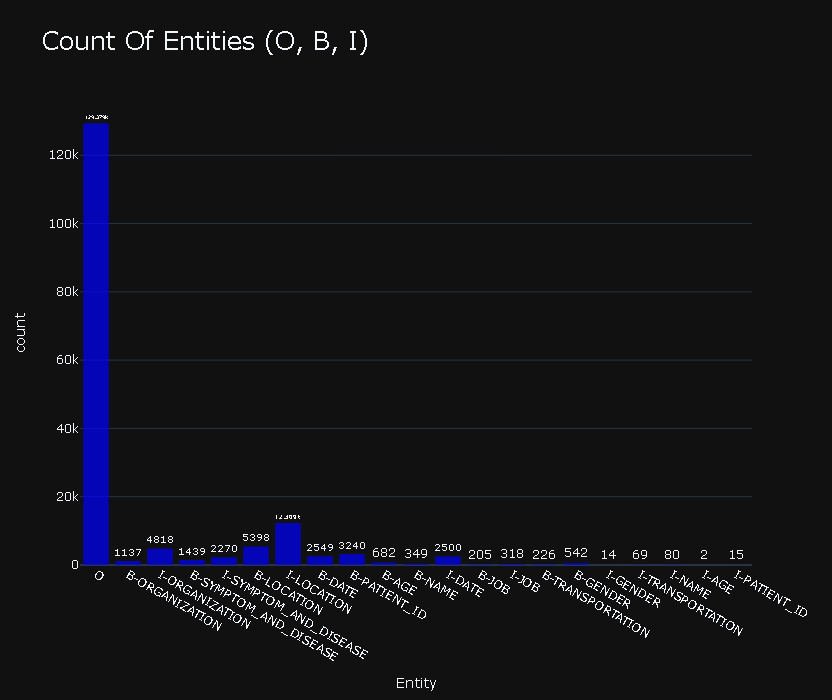

In [1386]:
histogram(token_entity_train, "Count Of Entities (O, B, I)")

#### 2.1.2 Các entity chính

In [1387]:
entities = token_entity_train_clear.loc[~(token_entity_train_clear['Entity'] == 'O')]

In [1388]:
print("Số lượng các token được gắn nhãn entity (B, I): ",entities.shape[0])

Số lượng các token được gắn nhãn entity (B, I):  38063


In [1389]:
entities.head()

,Token,Entity
23,Bộ,B-ORGANIZATION
24,Y,I-ORGANIZATION
25,tế,I-ORGANIZATION
38,sốt,B-SYMPTOM_AND_DISEASE
39,cao,I-SYMPTOM_AND_DISEASE


In [1390]:
entities["Entity"].unique()

array(['B-ORGANIZATION', 'I-ORGANIZATION', 'B-SYMPTOM_AND_DISEASE',
       'I-SYMPTOM_AND_DISEASE', 'B-LOCATION', 'I-LOCATION', 'B-DATE',
       'B-PATIENT_ID', 'B-AGE', 'B-NAME', 'I-DATE', 'B-JOB', 'I-JOB',
       'B-TRANSPORTATION', 'B-GENDER', 'I-GENDER', 'I-TRANSPORTATION',
       'I-NAME', 'I-AGE', 'I-PATIENT_ID'], dtype=object)

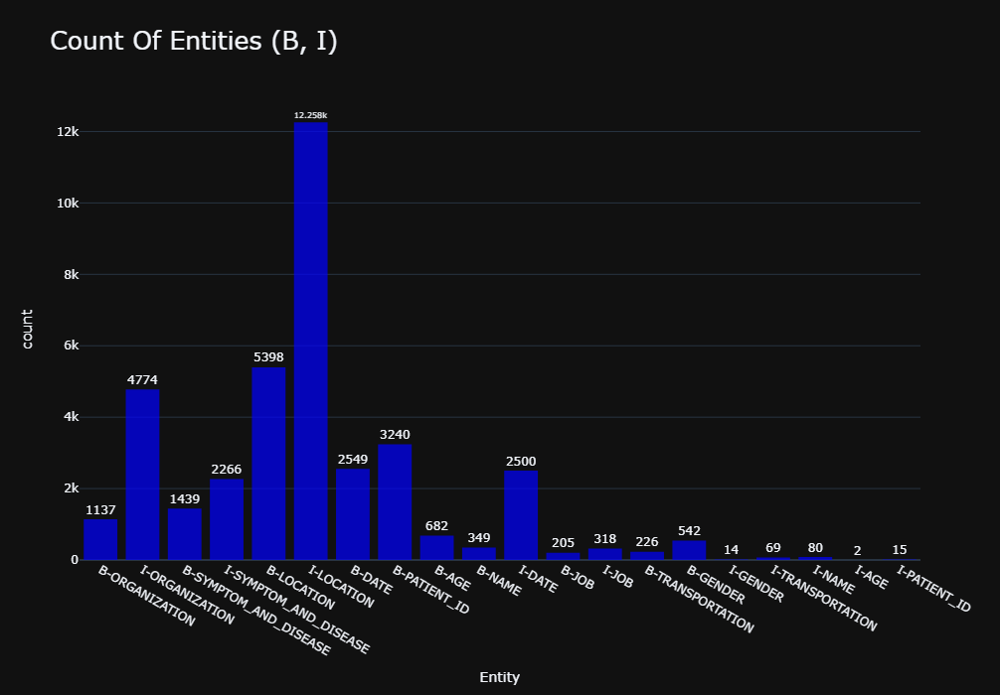

In [1391]:
histogram(entities, "Count Of Entities (B, I)")

**Gộp chung B-Entity và I-Entity trong các cụm từ thành Entity đại diện cho cả cụm từ**

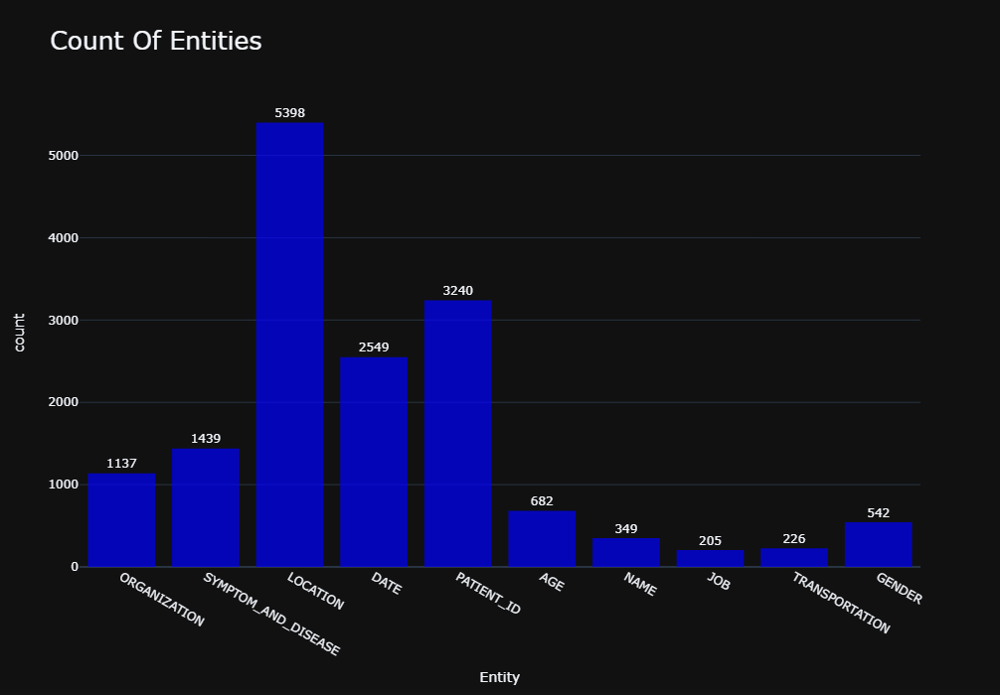

In [1392]:
entities_merge = entities.copy()
entities_merge =  entities_merge[entities_merge['Entity'].str[0] == 'B']
entities_merge['Entity'] = entities_merge['Entity'].str[2:]
histogram(entities_merge, "Count Of Entities")

**Nhận xét:**
- Entity LOCATION xuất hiện nhiều nhất trong tập giữ liệu, tiếp theo đó là PATIENT_ID và DATE
- Các entity có số lần xuất hiện thấp: AGE, NAME, JOB, TRANSPORTATION, GENDER

#### 2.1.3 Tỉ lệ trung bình của các từ thuộc nhãn O và nhãn khác O trong một câu 

In [1393]:
df = percentEntity(file_path_train)
cm = sns.light_palette("green", as_cmap=True)
styled_df = df.style.background_gradient(cmap=cm, subset=['%'])
styled_df

,Enity,%
0,O,77.001299
1,B-ORGANIZATION,0.616758
2,I-ORGANIZATION,2.551486
3,B-SYMPTOM_AND_DISEASE,0.932719
4,I-SYMPTOM_AND_DISEASE,1.309669
5,B-LOCATION,3.323186
6,I-LOCATION,7.614696
7,B-DATE,1.707645
8,B-PATIENT_ID,1.960094
9,B-AGE,0.437854


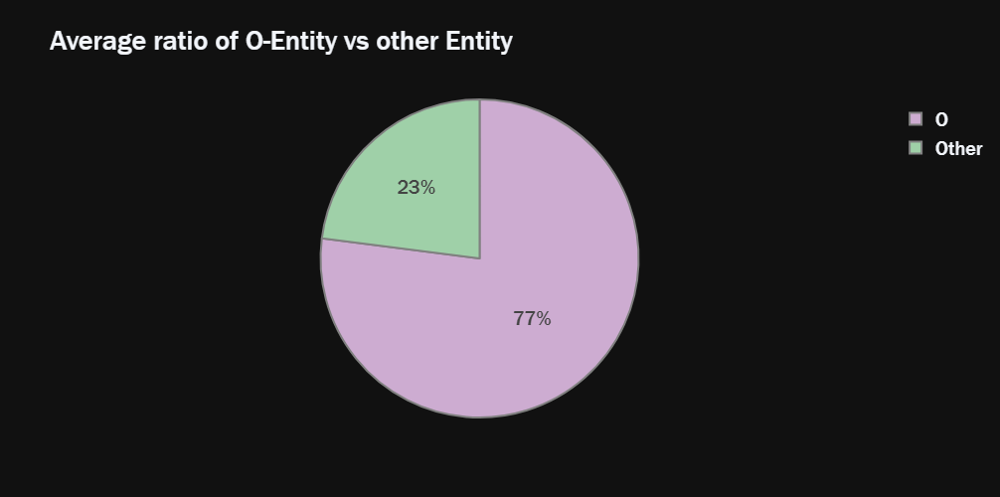

In [1394]:
pie_chart(df, "Average ratio of O-Entity vs other Entity")

### 2.2 Phân tích cụ thể các entity

#### 2.2.1 ORGANIZATION

In [1395]:
organization = token_entity_train.loc[(token_entity_train['Entity'] == 'B-ORGANIZATION') | (token_entity_train['Entity'] == 'I-ORGANIZATION')]

In [1396]:
organization.head()

,Token,Entity
23,Bộ,B-ORGANIZATION
24,Y,I-ORGANIZATION
25,tế,I-ORGANIZATION
174,Bộ,B-ORGANIZATION
175,Y,I-ORGANIZATION


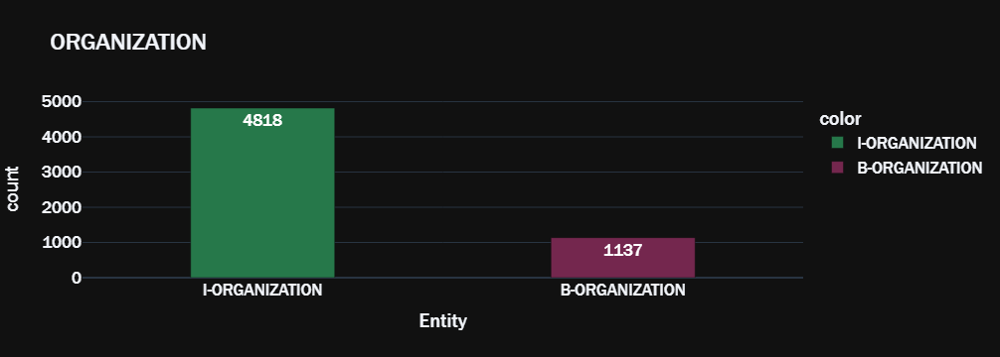

In [1397]:
count_plot(organization,'ORGANIZATION')

**Nhận xét:**

- Ở entity ORGANIZATION, số lượng I-ORANIZATION gấp khoảng 4 lần B-ORGANIZATION vì tên của các tổ chức thường có nhiều chữ, ví dụ:
    - "Cục Quản lý Khám chửa bệnh":
        - Cục -> B-ORGANIZATION
        - Quản -> I-ORGANIZATION
        - lý -> I-ORGANIZATION
        - Khám -> I-ORGANIZATION
        - chữa -> I-ORGANIZATION
        - bệnh -> I-ORGANIZATION


#### 2.2.2 DATE

In [1398]:
date = token_entity_train.loc[(token_entity_train['Entity'] == 'B-DATE') | (token_entity_train['Entity'] == 'I-DATE')]

In [1399]:
date.head()

,Token,Entity
142,2/3,B-DATE
182,31/7,B-DATE
207,14,B-DATE
208,-,I-DATE
209,4,I-DATE


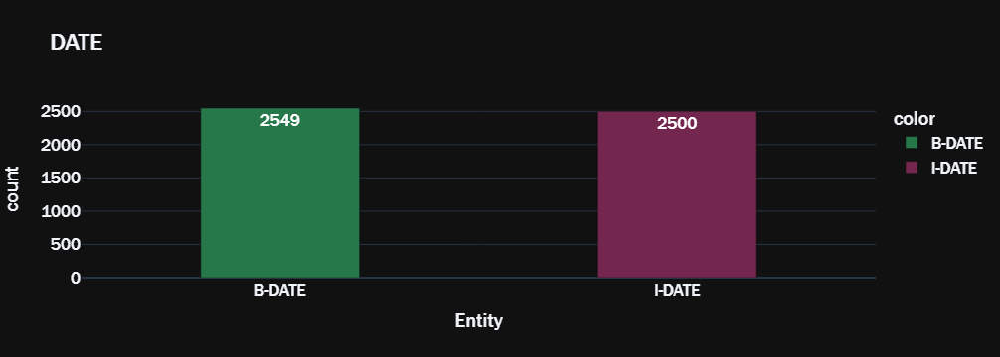

In [1400]:
count_plot(date,'DATE')

**Nhận xét:**

- Ở entity DATE, tỉ lệ B-DATE và I-DATE xấp xỉ bằng nhau vì đối tượng DATE thường được biểu diễn bằng 2 giá trị là ngày và tháng. Một số trường hợp điển hình như:
    - "13/3"
        - 13/3 -> B-DATE
    - "16 - 7"
        - 16 -> B-DATE
        - "-" -> I-DATE
        - 6 -> I-DATE

#### 2.2.3 PATIENT_ID

In [1401]:
patient_id = token_entity_train.loc[(token_entity_train['Entity'] == 'B-PATIENT_ID') | (token_entity_train['Entity'] == 'I-PATIENT_ID')].reset_index()

In [1402]:
patient_id.head()

,index,Token,Entity
0,159,523,B-PATIENT_ID
1,167,522,B-PATIENT_ID
2,188,188,B-PATIENT_ID
3,260,91,B-PATIENT_ID
4,398,861,B-PATIENT_ID


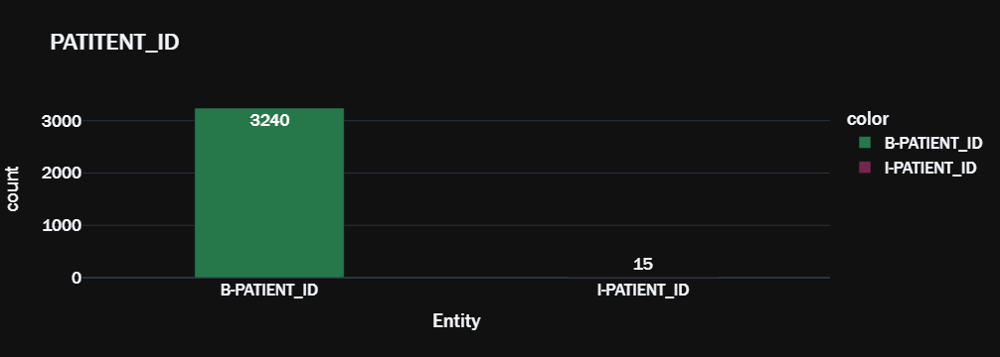

In [1403]:
count_plot(patient_id,'PATITENT_ID')

**Nhận xét:**

- Ở entity PATIENT_ID, phần lớn là chỉ có B-PATIENT_ID vì thường PATIENT_ID được thể hiện bởi 1 con số duy nhất (PATIENT_ID đại diện cho thứ tự ca mắc bệnh của bệnh nhân), ví dụ:
    - "Bệnh nhân 930"
        - Bệnh -> O
        - nhân -> O
        - 930 -> B-PATIENT_ID

- Xem xét 15 trường hợp xuất hiện giá trị I-PATIENT_ID:

In [1404]:
patient_id[patient_id["Entity"] == "I-PATIENT_ID"]['Token'].unique()

array(['viện', 'Nhiệt', 'đới', 'Trung', 'ương', 'cơ', 'sở', '2', '330',
       '-', '7', '436', '3', '1031'], dtype=object)

**Nhận xét:**

- Sự xuất hiện của các giá trị I-PATIENT_ID này là do các trường hợp:
    - Cách viết tắt từ "BN" (bệnh nhân), ví dụ:
        - "BN 565"
            - BN -> B-PATIENT_ID
            - 565 -> I-PATIENT_ID
    - Các thực thể trong tập dữ liệu bị gắn nhãn sai, ví dụ:
        - "Bệnh viện Nhiệt đới Trung ương cơ sở 2"
            - Bệnh -> B-PATIENT_ID
            - viện -> I-PATIENT_ID
            - Nhiệt -> I-PATIENT_ID
            - đới -> I-PATIENT_ID
            - Trung -> I-PATIENT_ID
            - ương -> I-PATIENT_ID
            - cơ -> I-PATIENT_ID
            - sở -> I-PATIENT_ID
            - 2 -> I-PATIENT_ID
    

#### 2.2.4 NAME

In [1405]:
name = token_entity_train.loc[(token_entity_train['Entity'] == 'B-NAME') | (token_entity_train['Entity'] == 'I-NAME')]

In [1406]:
name.head()

,Token,Entity
189,L.T.H.,B-NAME
1541,N.X.T.,B-NAME
1558,N.Q.T.,B-NAME
1585,Nguyễn,B-NAME
1586,Chí,I-NAME


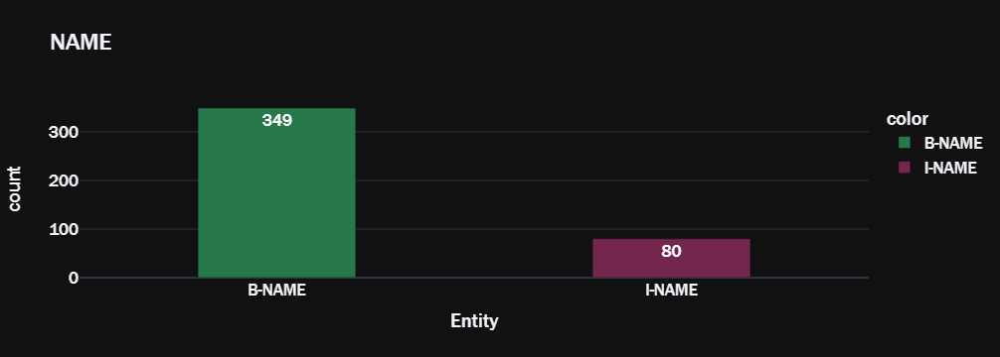

In [1407]:
count_plot(name,'NAME')

**Nhận xét:**

- Ở entity NAME, số lượng B-NAME nhiều hơn khoảng 4 lần I-NAME là các nguyên nhân sau:
    - Cách viết tắt toàn bộ tên bệnh nhân để bảo vệ quyền riêng tư của bệnh nhân, ví dụ:
        - "Bệnh nhân N.T.C.L"
            - Bệnh nhân -> O
            - N.T.C.L -> B-NAME
    - Chỉ có mỗi tên (không có họ và tên đệm):, ví dụ:
        - "Chị An"
            - Chị -> O
            - An -> B-NAME
- Sự xuất hiện của 73 giá trị I-NAME có thể đến từ các trường hợp:
    - Viết đầy đủ tên hoặc viết tắt một số thành phần trong tên, ví dụ:
        - "Chị Hồ Thị H"
            - Chị -> O
            - Hồ -> B-NAME
            - Thị -> I-NAME
            - H -> I-NAME
    

#### 2.2.5 GENDER

In [1408]:
gender = token_entity_train.loc[(token_entity_train['Entity'] == 'B-GENDER') | (token_entity_train['Entity'] == 'I-GENDER')].reset_index()

In [1409]:
gender.head()

,index,Token,Entity
0,697,nam,B-GENDER
1,818,phụ,B-GENDER
2,819,nữ,I-GENDER
3,1251,nam,B-GENDER
4,1478,nam,B-GENDER


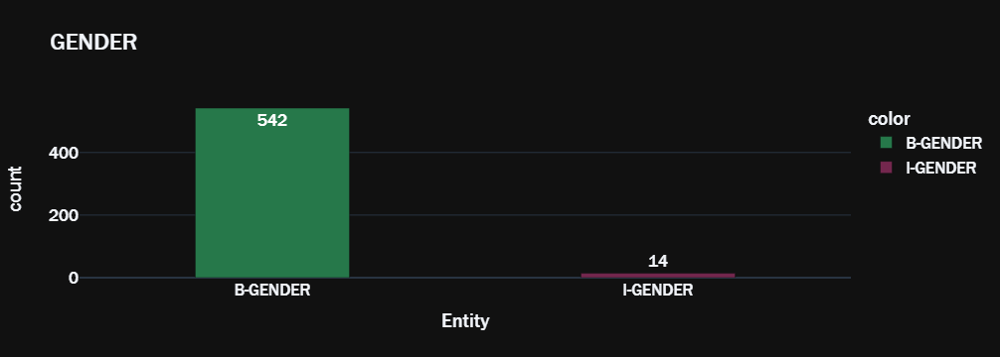

In [1410]:
count_plot(gender,'GENDER')

In [1411]:
gender["Token"].unique()

array(['nam', 'phụ', 'nữ', 'gái', 'Nam', 'nữ', 'trai', 'Nữ', 'Nữ',
       'đàn', 'ông', '64', 'bà'], dtype=object)

**Nhận xét:**

- Ở entity GENDER có số lượng B-GENDER chiếm đa số vì giới tính thường chỉ ngắn gọn trong một từ là nam/nữ/trai/gái..., ví dụ:
    - "BN 100 là nữ"
        - BN -> B-PATIENT
        - 100 -> I-PATIENT
        - là -> O
        - nữ -> B-GENDER
- Có 14 giá trị I-GENDER vì có thể sảy ra một số trường hợp như sau:
    - "nữ giới"
        - nữ -> B-GENDER
        - giới -> I-GENDER
    - "phụ nữ"
        - phụ -> B-GENDER
        - nữ -> I-GENDER
    - Một số trường hợp bị gắn nhãn sai:
        - 64 -> Gender
      

#### 2.2.6 AGE

In [1412]:
age = token_entity_train.loc[(token_entity_train['Entity'] == 'B-AGE') | (token_entity_train['Entity'] == 'I-AGE')].reset_index()

In [1413]:
age.head()

,index,Token,Entity
0,170,67,B-AGE
1,699,25,B-AGE
2,821,64,B-AGE
3,1253,28,B-AGE
4,1480,20,B-AGE


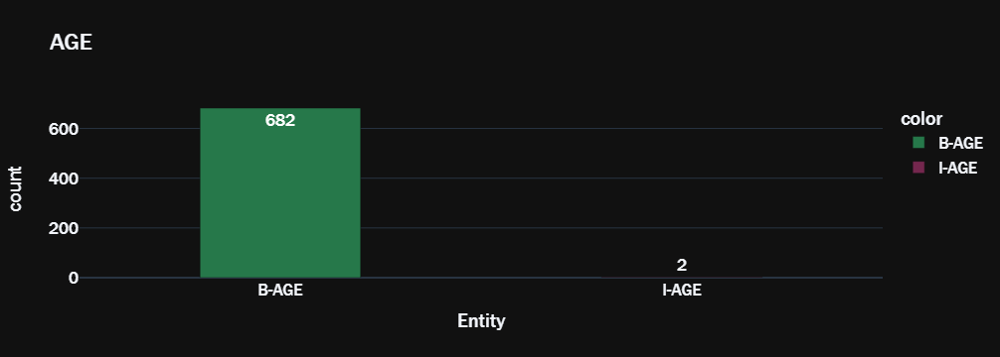

In [1414]:
count_plot(age,'AGE')

**Nhận xét:**

- Ở entity AGE thường chỉ xuất hiện B-AGE vì độ tuổi chỉ được biểu diễn bằng một con số, ví dụ:
    - "chị An 25 tuổi"
        - chị -> O
        - An -> B-NAME
        - 25 -> B-AGE
        - tuổi -> O

- Xem xét trường hợp xuất hiện 2 giá trị I-AGE

In [1415]:
age[age["Entity"] == "I-AGE"]

,index,Token,Entity
80,17743,tháng,I-AGE
257,63482,tháng,I-AGE


**Nhận xét:**

- Là trường hợp trẻ sơ sinh (có độ tuổi được tính bằng tháng), ví dụ:
    - "bé gái 3 tháng tuổi"
        - bé -> O
        - gái -> B-GENDER
        - 3 -> B-AGE
        - tháng -> I-AGE
        - tuổi -> O

#### 2.2.7 JOB

In [1416]:
job = token_entity_train.loc[(token_entity_train['Entity'] == 'B-JOB') | (token_entity_train['Entity'] == 'I-JOB')]

In [1417]:
job.head()

,Token,Entity
262,phi,B-JOB
263,công,I-JOB
1493,du,B-JOB
1494,học,I-JOB
1495,sinh,I-JOB


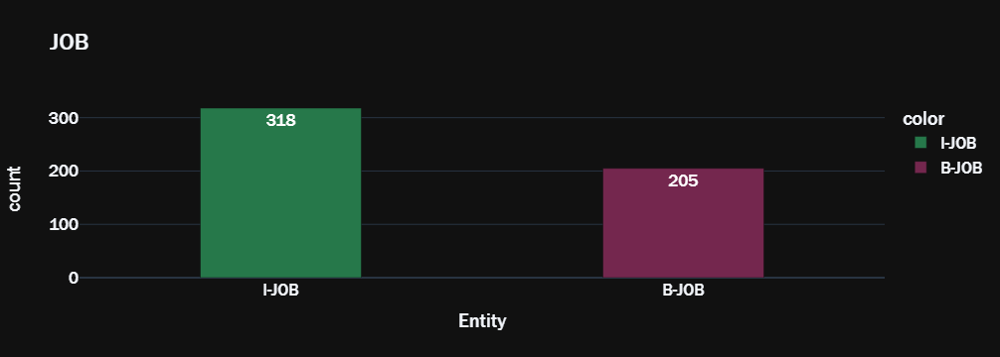

In [1418]:
count_plot(job,'JOB')

**Nhận xét:**

- Ở entity JOB, số lượng I-JOB gấp khoảng 1.5 lần B-JOB vì tên các công việc thường có 2 chữ, ví dụ:
    - "anh là công nhân"
        - Anh -> O
        - là -> O
        - công -> B-JOB
        - nhân -> I-JOB

#### 2.2.8 LOCATION

In [1419]:
location = token_entity_train.loc[(token_entity_train['Entity'] == 'B-LOCATION') | (token_entity_train['Entity'] == 'I-LOCATION')]

In [1420]:
location.head()

,Token,Entity
131,Doha,B-LOCATION
133,Qatar,B-LOCATION
138,Tân,B-LOCATION
139,Sơn,I-LOCATION
140,Nhất,I-LOCATION


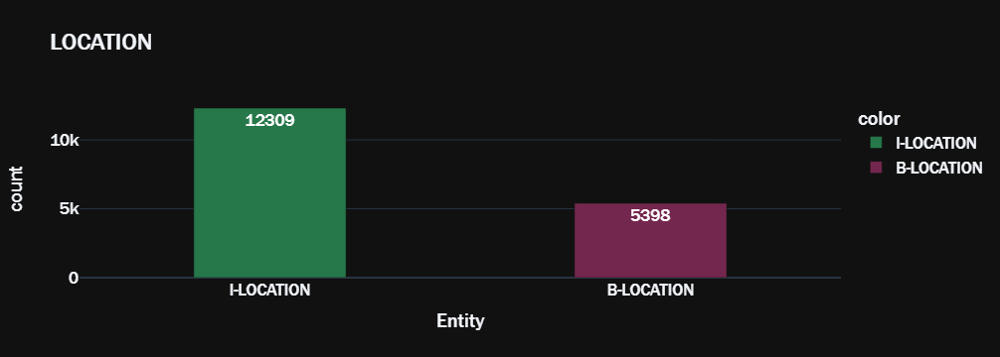

In [1421]:
count_plot(location,'LOCATION')

**Nhận xét:**

- Ở entity LOCATION, số lượng I-LOCATION gấp khoảng 2.5 lần B-LOCATION vì tên các vị trí thường có nhiều chữ, ví dụ:
    - "trú tại Hà Nội"
        - trú -> O
        - tại -> O
        - Hà -> B-LOCATION
        - Nội -> I-LOCATION

#### 2.2.9  SYMPTOM_AND_DISEASE

In [1422]:
symptom_and_disease = token_entity_train.loc[(token_entity_train['Entity'] == 'B-SYMPTOM_AND_DISEASE') | (token_entity_train['Entity'] == 'I-SYMPTOM_AND_DISEASE')]

In [1423]:
symptom_and_disease.head()

,Token,Entity
38,sốt,B-SYMPTOM_AND_DISEASE
39,cao,I-SYMPTOM_AND_DISEASE
41,khó,B-SYMPTOM_AND_DISEASE
42,thở,I-SYMPTOM_AND_DISEASE
386,suy,B-SYMPTOM_AND_DISEASE


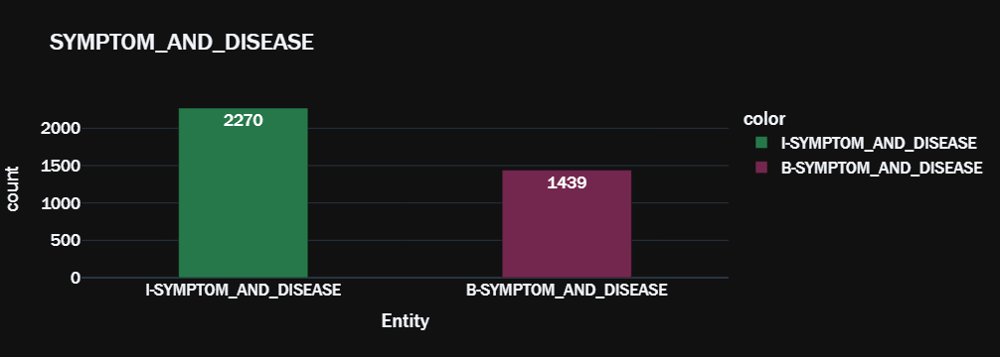

In [1424]:
count_plot(symptom_and_disease,'SYMPTOM_AND_DISEASE')

**Nhận xét:**

- Ở entity SYMPTOM_AND_DISEASE, số lượng I-SYMPTOM_AND_DISEASE gấp khoảng 2 lần B-SYMPTOM_AND_DISEASE vì việc thể hiện các triệu chứng và bệnh thường dùng nhiều chữ, ví dụ:
    - "bệnh nhân bị suy phổi nặng"
        - bệnh -> O
        - nhân -> O
        - bị -> O
        - suy -> B-SYMPTOM_AND_DISEASE
        - phổi -> I-SYMPTOM_AND_DISEASE
        - nặng -> I-SYMPTOM_AND_DISEASE

#### 2.2.10 TRANSPORTATION

In [1425]:
transportation = token_entity_train.loc[(token_entity_train['Entity'] == 'B-TRANSPORTATION') | (token_entity_train['Entity'] == 'I-TRANSPORTATION')]

In [1426]:
transportation.head()

,Token,Entity
508,VN0054,B-TRANSPORTATION
1511,VN,B-TRANSPORTATION
1512,0054,I-TRANSPORTATION
1565,VN,B-TRANSPORTATION
1566,0054,I-TRANSPORTATION


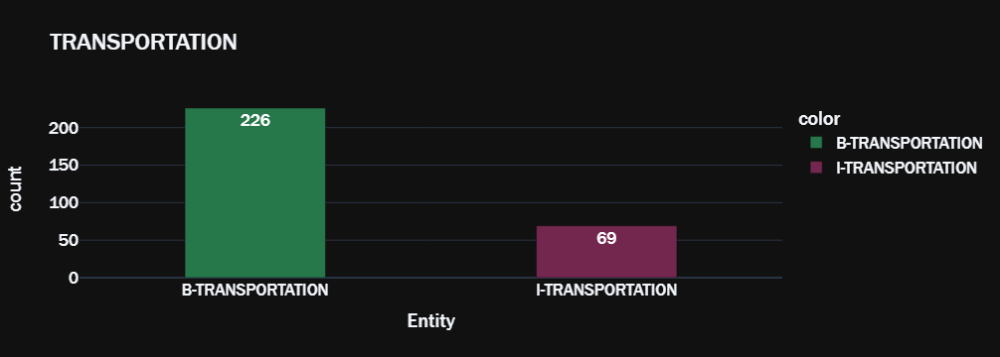

In [1427]:
count_plot(transportation,'TRANSPORTATION')

In [1428]:
transportation["Token"].unique()

array(['VN0054', 'VN', '0054', 'NH898', 'VN6', 'VJ647', '6E8679',
       'VN0062', 'VN2', 'VN54', 'VN5062', 'VJ1379', '0018', 'VJ2849',
       'VN1915', 'VN814', 'SU290', 'TK', '1770', 'TK162', '54', 'VN5002',
       'VJ7816', 'VN1', 'VN62', 'AK1502', 'VN0050', 'SE', '7', 'VN319',
       'SU', '290', 'TG', '564', 'OZ773', '43', 'B', '-', '03126',
       'VN054', '18', 'AF258', 'QR', '974', 'VJ7387', 'tàu', 'Viking',
       'Cruise', 'VN50', 'VJ2432', 'IO4405', 'VJ', '647', 'VN88', 'QR974',
       '162', '981', 'EK30', 'EK364', 'EK', '394', 'EK4', 'EK392', '164',
       'VN272', 'VN607', 'BR395', 'SP3', '5062', 'chở', 'gas', 'Texiana',
       'CX906', 'VN163', '122', 'VN223', 'VJ981', 'QR977', 'QR0976',
       'VJ826', 'IO', '4405', '0062', 'VN340', 'JL752'], dtype=object)

**Nhận xét:**

- Entity TRANSPORTATION có số lượng xuất hiện rất thấp so với các entity khác, vì đây là entity mô tả số hiệu của các chuyến bay hoặc biển số xe (ô tô/gắn máy) có vận chuyển các hành khách bị mắc bệnh.

- Ở entity TRANSPORTATION, số lượng B-TRANSPORTATION gấp khoảng 3.3 lần I-TRANSPORTATION vì:
    - Số hiệu các chuyến bay thường chỉ có một mã định danh duy nhất: 
        - "chuyến bay VN54"
            - chuyến bay -> O
            - VN54 -> B-TRANSPORTATION
    - Do cách viết rời rạc về biển số/số hiệu (trường hợp thiểu số)
        - "biển số xe 43 B - 01234"
            - biển -> O
            - số -> O
            - xe -> O
            - 43 -> B-TRANSPORTATION
            - B -> I-TRANSPORTATION
            - "-" -> I-TRANSPORTATION
            - 01234 -> I-TRANSPORTATION

# C. EDA test_syllable

## 1. Sentence

### 1.1 Số lượng sentences

In [1429]:
num_sentence(file_path_test)

Số câu (sentence) trong tập dữ liệu là: 3000


### 1.2 Các giá trị thống kê cơ bản

In [1430]:
statistic_sentence(file_path_test)

Độ dài câu dài nhất: 185
Độ dài câu ngắn nhất: 8
Độ dài trung bình của các câu: 36.118


## 2. Entity

### 2.1 Tổng quan các entity

#### 2.1.1 Số lượng các token được gán I-ENTITY, B-ENTITY và O-ENTITY

In [1431]:
print("Số lượng các token được gắn nhãn entity (O, B, I): ",token_entity_test.shape[0])

Số lượng các token được gắn nhãn entity (O, B, I):  108354


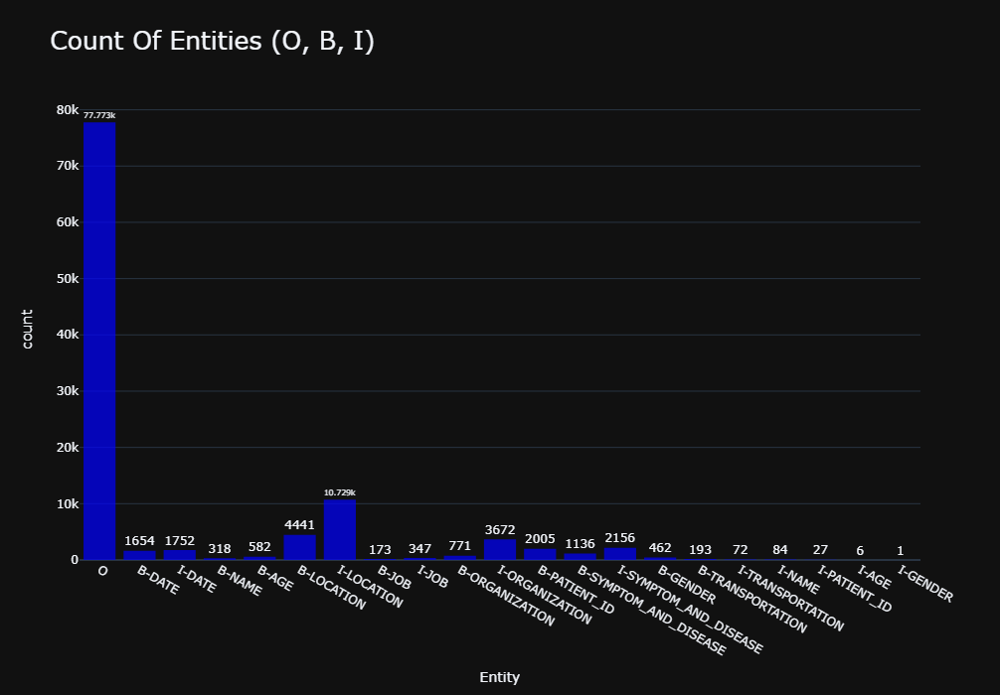

In [1432]:
histogram(token_entity_test, "Count Of Entities (O, B, I)")

#### 2.1.2 Các entity chính

In [1433]:
entities = token_entity_test_clear.loc[~(token_entity_test_clear['Entity'] == 'O')]

In [1434]:
print("Số lượng các token được gắn nhãn entity (B, I): ",entities.shape[0])

Số lượng các token được gắn nhãn entity (B, I):  30446


In [1435]:
entities["Entity"].unique()

array(['B-DATE', 'I-DATE', 'B-NAME', 'B-AGE', 'B-LOCATION', 'I-LOCATION',
       'B-JOB', 'I-JOB', 'B-ORGANIZATION', 'I-ORGANIZATION',
       'B-PATIENT_ID', 'B-SYMPTOM_AND_DISEASE', 'I-SYMPTOM_AND_DISEASE',
       'B-GENDER', 'B-TRANSPORTATION', 'I-TRANSPORTATION', 'I-NAME',
       'I-PATIENT_ID', 'I-AGE', 'I-GENDER'], dtype=object)

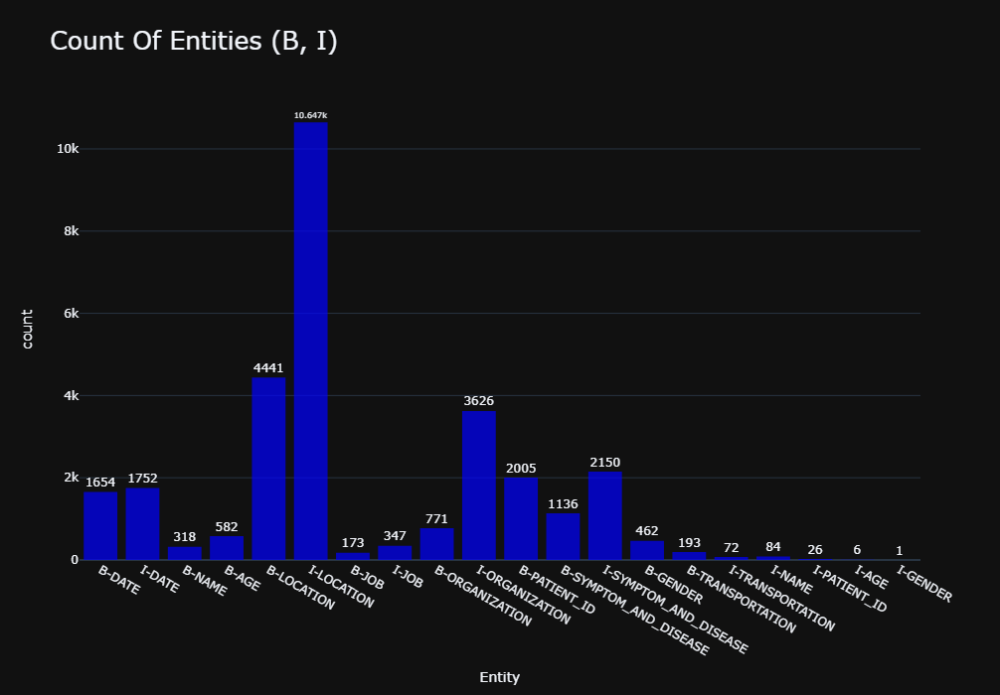

In [1436]:
histogram(entities, "Count Of Entities (B, I)")

**Gộp chung B-Entity và I-Entity trong các cụm từ thành Entity đại diện cho cả cụm từ**

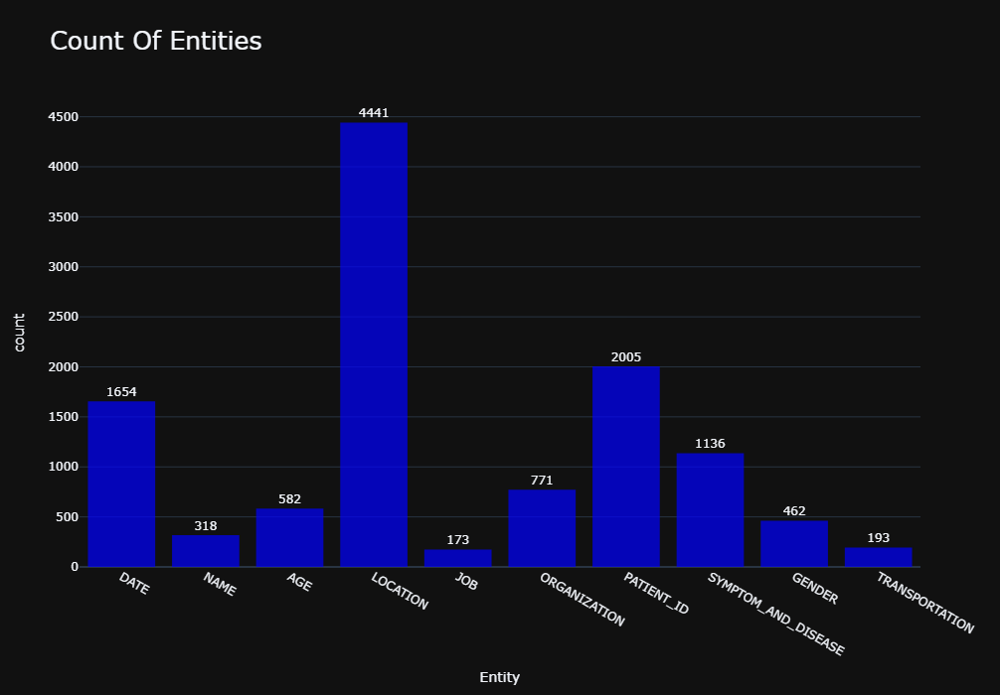

In [1437]:
entities_merge = entities.copy()
entities_merge =  entities_merge[entities_merge['Entity'].str[0] == 'B']
entities_merge['Entity'] = entities_merge['Entity'].str[2:]
histogram(entities_merge, "Count Of Entities")

**Nhận xét:**
- Entity LOCATION xuất hiện nhiều nhất trong tập giữ liệu, tiếp theo đó là PATIENT_ID và DATE
- Các entity có số lần xuất hiện thấp: AGE, NAME, JOB, TRANSPORTATION, GENDER

#### 2.1.3 Tỉ lệ trung bình của các từ thuộc nhãn O và nhãn khác O trong một câu 

In [1438]:
df = percentEntity(file_path_test)
cm = sns.light_palette("green", as_cmap=True)
styled_df = df.style.background_gradient(cmap=cm, subset=['%'])
styled_df

,Enity,%
0,O,71.887220
1,B-DATE,1.712144
2,I-DATE,1.528613
3,B-NAME,0.277006
4,B-AGE,0.545060
5,B-LOCATION,4.172626
6,I-LOCATION,10.042738
7,B-JOB,0.148745
8,I-JOB,0.307042
9,B-ORGANIZATION,0.641196


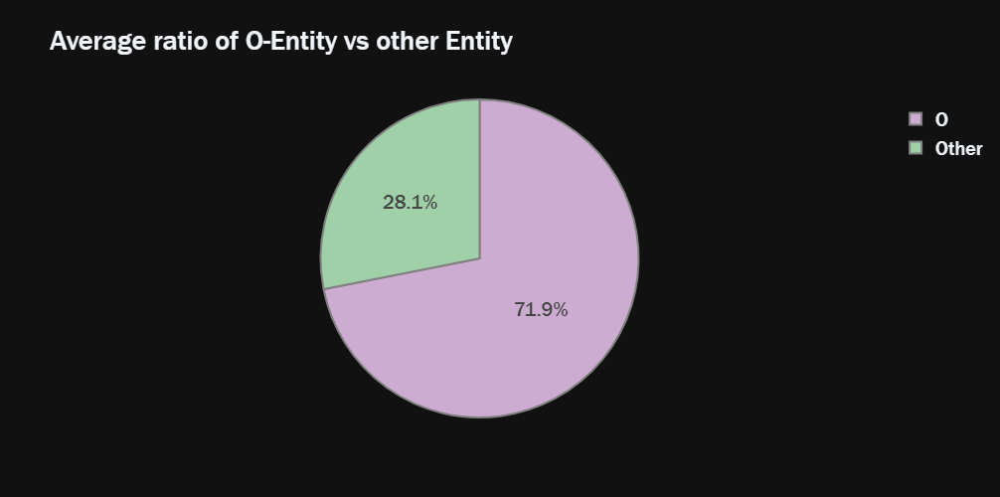

In [1439]:
pie_chart(df, "Average ratio of O-Entity vs other Entity")

### 2.2 Phân tích cụ thể các entity

#### 2.2.1 ORGANIZATION

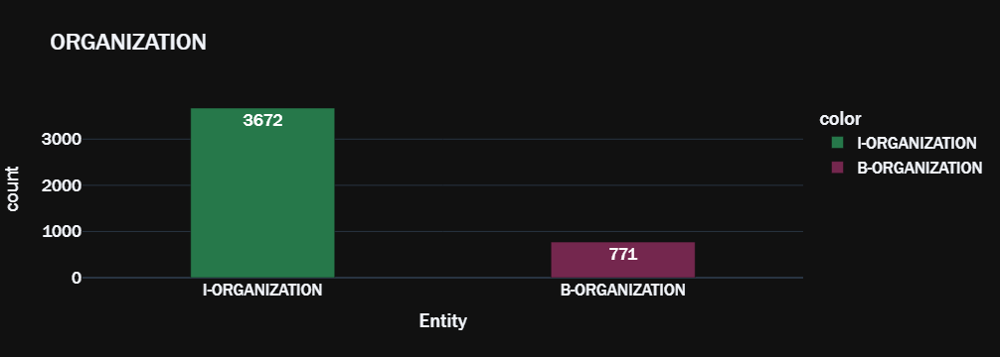

In [1440]:
organization = token_entity_test.loc[(token_entity_test['Entity'] == 'B-ORGANIZATION') | (token_entity_test['Entity'] == 'I-ORGANIZATION')]
count_plot(organization,'ORGANIZATION')

#### 2.2.2 DATE

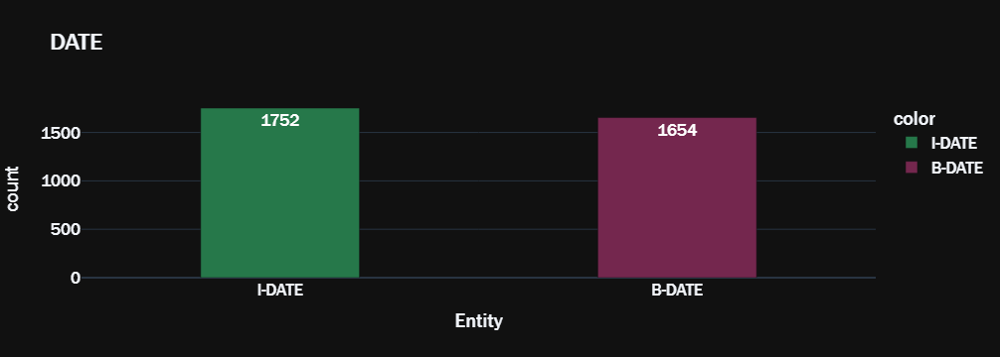

In [1441]:
date = token_entity_test.loc[(token_entity_test['Entity'] == 'B-DATE') | (token_entity_test['Entity'] == 'I-DATE')]
count_plot(date,'DATE')

#### 2.2.3 PATIENT_ID 

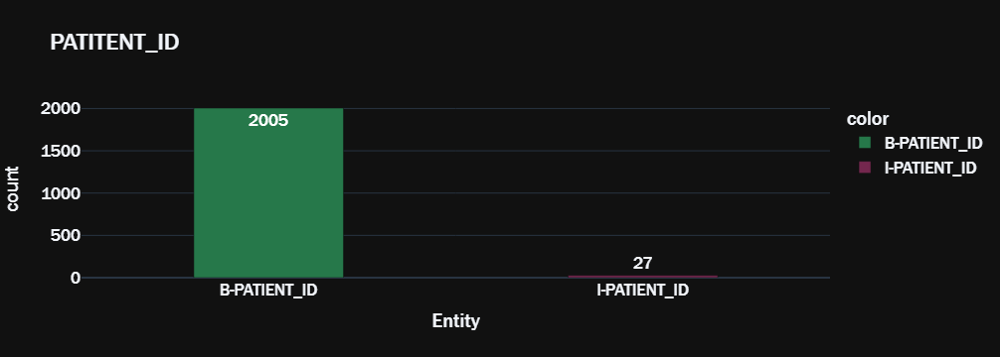

In [1442]:
patient_id = token_entity_test.loc[(token_entity_test['Entity'] == 'B-PATIENT_ID') | (token_entity_test['Entity'] == 'I-PATIENT_ID')].reset_index()
count_plot(patient_id,'PATITENT_ID')

#### 2.2.4 NAME

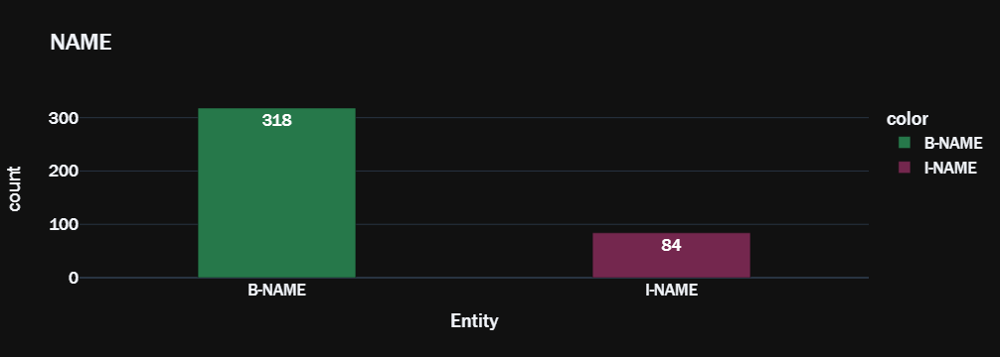

In [1443]:
name = token_entity_test.loc[(token_entity_test['Entity'] == 'B-NAME') | (token_entity_test['Entity'] == 'I-NAME')]
count_plot(name,'NAME')

#### 2.2.5 GENDER

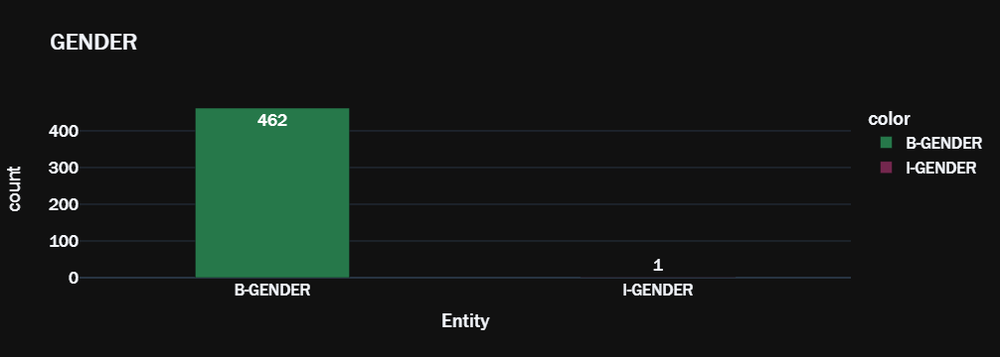

In [1444]:
gender = token_entity_test.loc[(token_entity_test['Entity'] == 'B-GENDER') | (token_entity_test['Entity'] == 'I-GENDER')].reset_index()
count_plot(gender,'GENDER')

#### 2.2.6 AGE

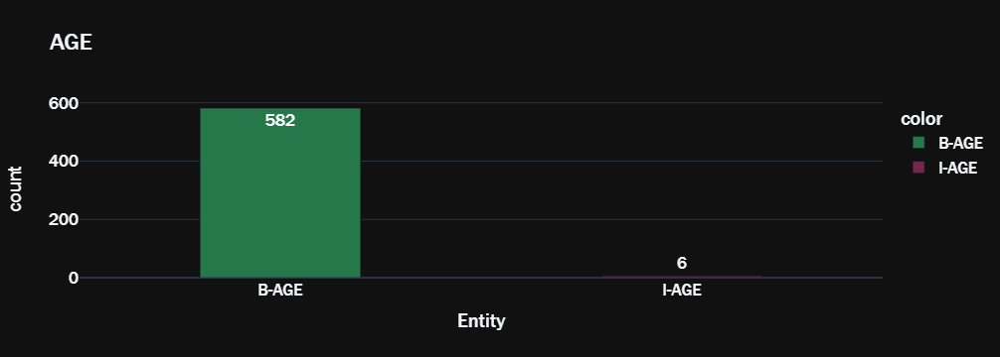

In [1445]:
age = token_entity_test.loc[(token_entity_test['Entity'] == 'B-AGE') | (token_entity_test['Entity'] == 'I-AGE')].reset_index()
count_plot(age,'AGE')

#### 2.2.7 JOB

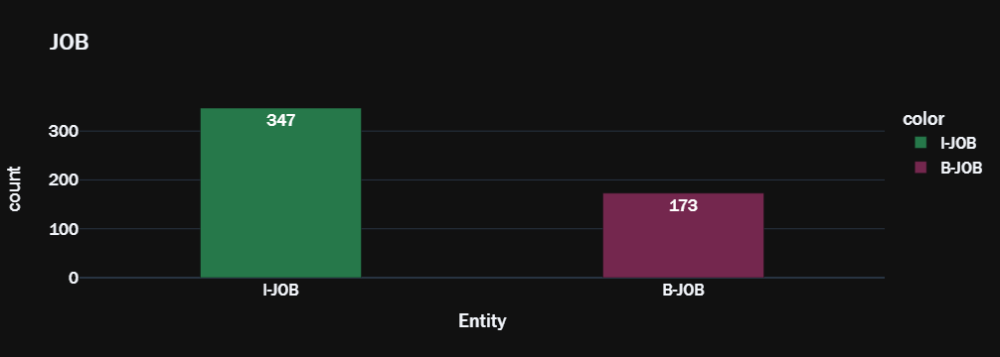

In [1446]:
job = token_entity_test.loc[(token_entity_test['Entity'] == 'B-JOB') | (token_entity_test['Entity'] == 'I-JOB')]
count_plot(job,'JOB')

#### 2.2.8 LOCATION

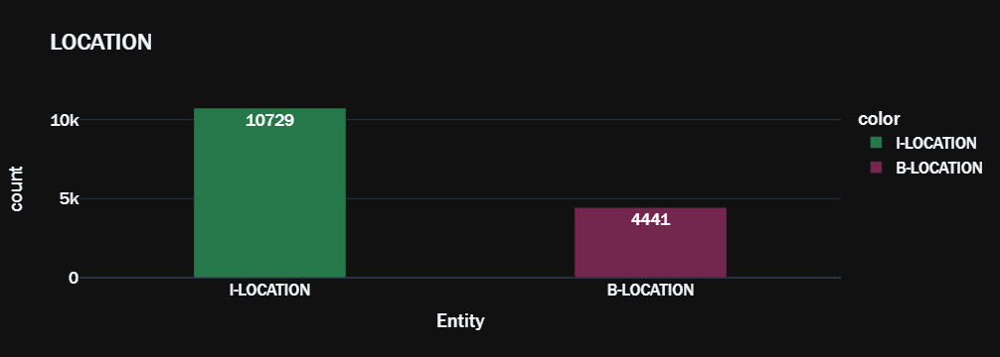

In [1447]:
location = token_entity_test.loc[(token_entity_test['Entity'] == 'B-LOCATION') | (token_entity_test['Entity'] == 'I-LOCATION')]
count_plot(location,'LOCATION')

#### 2.2.9 SYMPTOM_AND_DISEASE

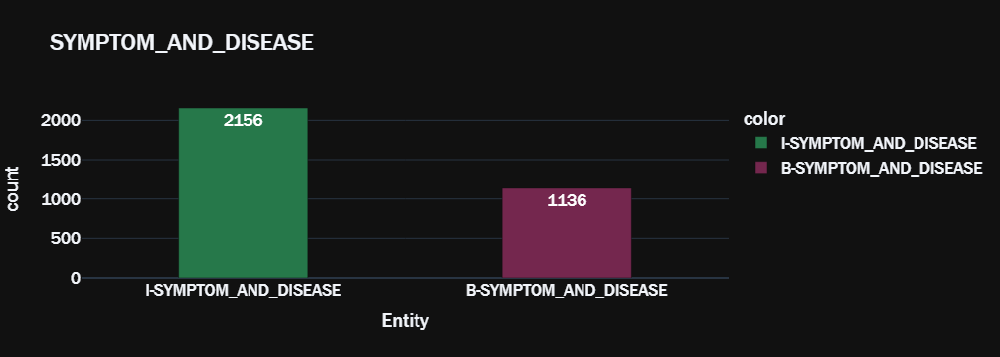

In [1448]:
symptom_and_disease = token_entity_test.loc[(token_entity_test['Entity'] == 'B-SYMPTOM_AND_DISEASE') | (token_entity_test['Entity'] == 'I-SYMPTOM_AND_DISEASE')]
count_plot(symptom_and_disease,'SYMPTOM_AND_DISEASE')

#### 2.2.10 TRANSPORTATION

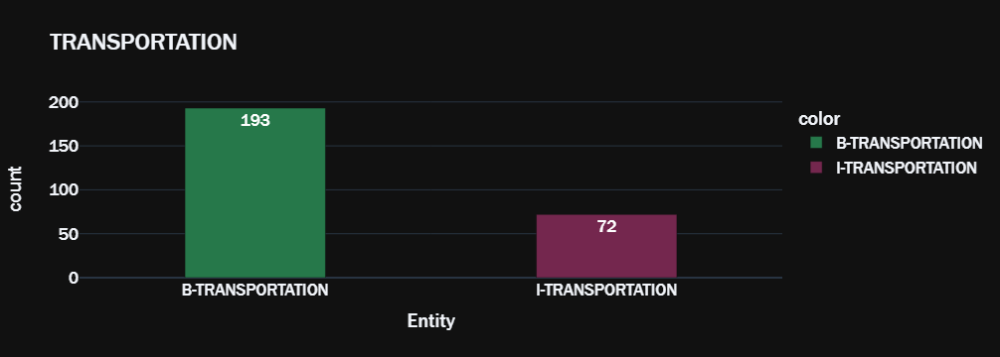

In [1449]:
transportation = token_entity_test.loc[(token_entity_test['Entity'] == 'B-TRANSPORTATION') | (token_entity_test['Entity'] == 'I-TRANSPORTATION')]
count_plot(transportation,'TRANSPORTATION')

# D. EDA dev_syllable

## 1. Sentence

### 1.1 Số lượng sentences

In [1450]:
num_sentence(file_path_dev)

Số câu (sentence) trong tập dữ liệu là: 2000


### 1.2 Các giá trị thống kê cơ bản


In [1451]:
statistic_sentence(file_path_dev)

Độ dài câu dài nhất: 182
Độ dài câu ngắn nhất: 7
Độ dài trung bình của các câu: 35.6625


# 2. Entity


#### 2.1.1 Số lượng các token được gán I-ENTITY, B-ENTITY và O-ENTITY

In [1452]:
print("Số lượng các token được gắn nhãn entity (O, B, I): ",token_entity_dev.shape[0])

Số lượng các token được gắn nhãn entity (O, B, I):  71325


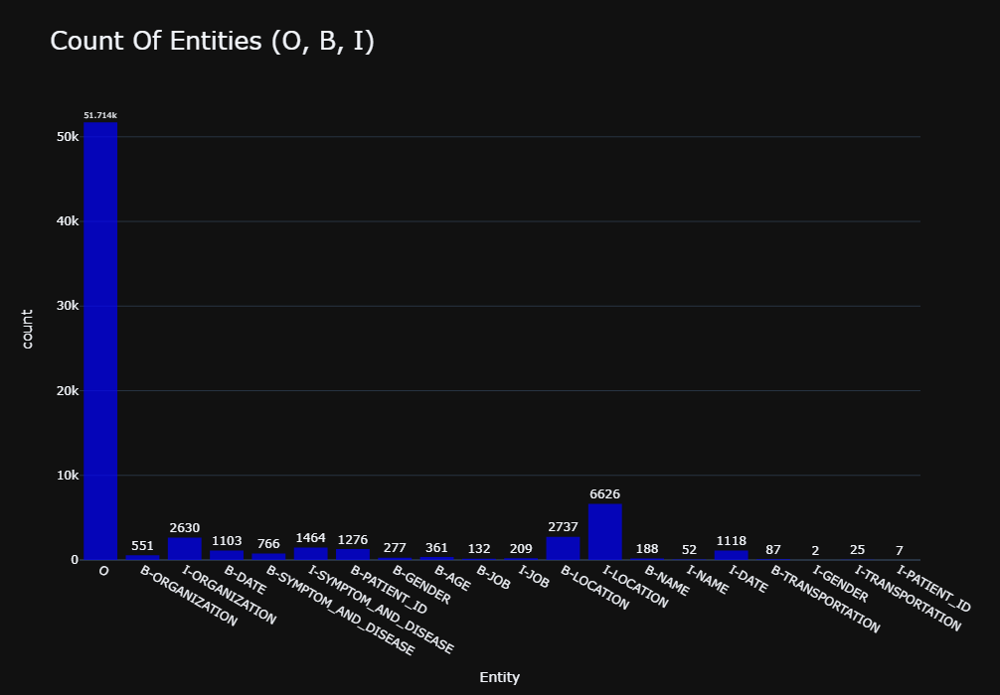

In [1453]:
histogram(token_entity_dev, "Count Of Entities (O, B, I)")

#### 2.1.2 Các entity chính

In [1454]:
entities = token_entity_dev_clear.loc[~(token_entity_dev_clear['Entity'] == 'O')]

In [1455]:
print("Số lượng các token được gắn nhãn entity (B, I): ",entities.shape[0])

Số lượng các token được gắn nhãn entity (B, I):  19523


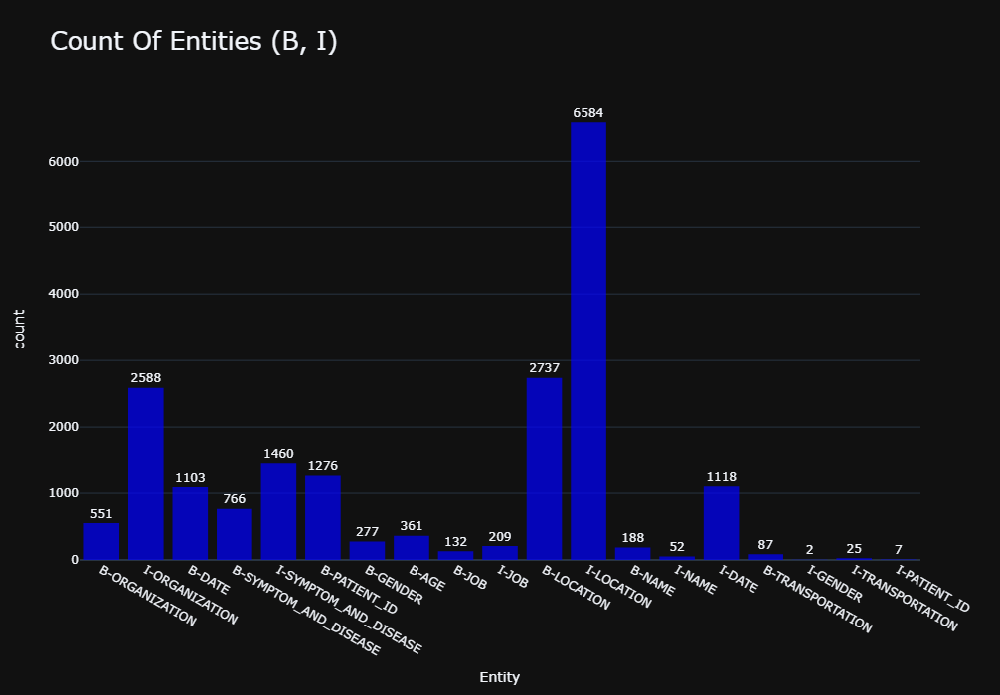

In [1456]:
histogram(entities, "Count Of Entities (B, I)")

**Gộp chung B-Entity và I-Entity trong các cụm từ thành Entity đại diện cho cả cụm từ**

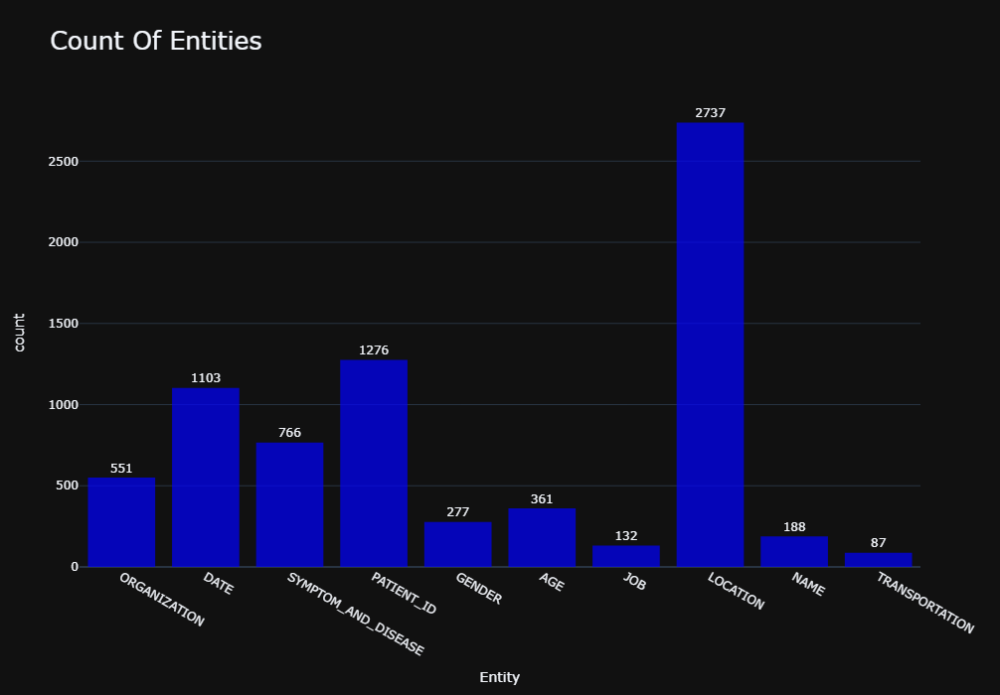

In [1457]:
entities_merge = entities.copy()
entities_merge =  entities_merge[entities_merge['Entity'].str[0] == 'B']
entities_merge['Entity'] = entities_merge['Entity'].str[2:]
histogram(entities_merge, "Count Of Entities")

#### 2.1.3 Tỉ lệ trung bình của các từ thuộc nhãn O và nhãn khác O trong một câu 

In [1458]:
df = percentEntity(file_path_dev)
cm = sns.light_palette("green", as_cmap=True)
styled_df = df.style.background_gradient(cmap=cm, subset=['%'])
styled_df

,Enity,%
0,O,72.412062
1,B-ORGANIZATION,0.722837
2,I-ORGANIZATION,3.233050
3,B-DATE,1.778796
4,B-SYMPTOM_AND_DISEASE,1.191499
5,I-SYMPTOM_AND_DISEASE,1.993132
6,B-PATIENT_ID,1.833312
7,B-GENDER,0.411129
8,B-AGE,0.494548
9,B-JOB,0.177016


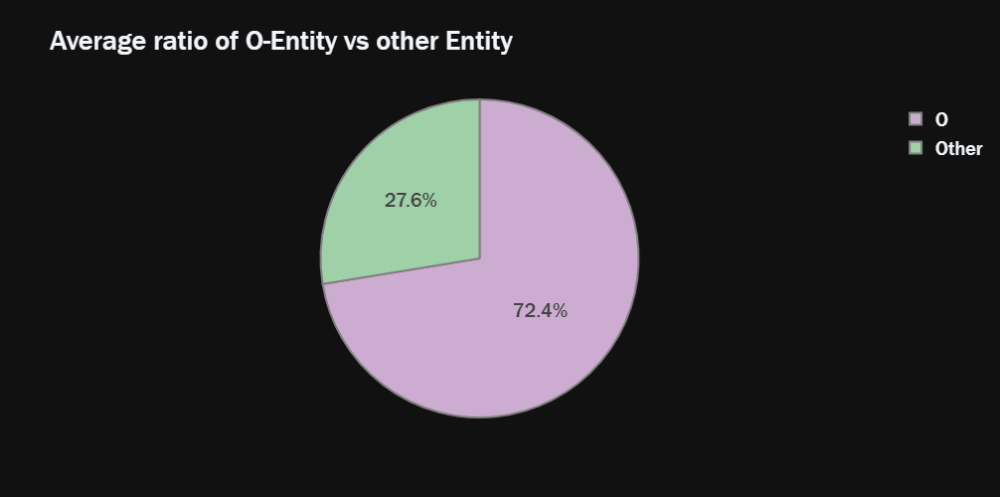

In [1459]:
pie_chart(df, "Average ratio of O-Entity vs other Entity")

# E. Nhận xét chung

**Nhận xét:**
- Qua quá trình EDA nhận thấy:
    - Tập train có số lượng mẫu đủ lớn để huấn luyện mô hình (~5000k mẫu), với tỉ lệ train:test:dev = 5:3:2.
    - Tập train có khả năng tổng quát hóa tốt.
    - Sự phân bố về tỉ lệ entity (B, I) ở các tập train/test/dev khá giống nhau.
    - Cả tập train, test, dev đều xuất hiện một số thực thể bị gắn nhãn sai, nhưng số lượng sai nhãn này rất thấp.  